In [4]:
import plotly.express as px
import geopandas as gpd
import pandas as pd

from pyogrio import list_layers


In [3]:
accoglienza_csv = pd.read_csv("https://raw.githubusercontent.com/ondata/liberiamoli-tutti/refs/heads/main/sbarchi-migranti/dati/accoglienza.csv")
accoglienza_csv.head()


,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,CodiceRegione,DenominazioneRegione
0,Abruzzo,2019-09-30,NaN,1364,527.0,NaN,13,Abruzzo
1,Basilicata,2019-09-30,NaN,1141,488.0,NaN,17,Basilicata
2,Calabria,2019-09-30,NaN,2029,2037.0,NaN,18,Calabria
3,Campania,2019-09-30,NaN,6107,1956.0,NaN,15,Campania
4,Emilia-Romagna,2019-09-30,NaN,7514,2250.0,NaN,8,Emilia-Romagna


In [15]:
# Verifico il dataset anche per una singola data del report
accoglienza_csv_20190930 = accoglienza_csv[accoglienza_csv["Data_Report"] == "2019-09-30"]
accoglienza_csv_20190930 = accoglienza_csv_20190930.rename(columns={"CodiceRegione": "COD_REG", "DenominazioneRegione": "DEN_REG"})
accoglienza_csv_20190930
accoglienza_csv = accoglienza_csv.rename(columns={"CodiceRegione": "COD_REG", "DenominazioneRegione": "DEN_REG"})

In [6]:
print(list_layers("/home/enrique/github/geospatialcourse2025/data/istat_administrative_units_generalized_2025.gpkg"))

regions = gpd.read_file("/home/enrique/github/geospatialcourse2025/data/istat_administrative_units_generalized_2025.gpkg", layer="regions")
# regions

macroregions = gpd.read_file("/home/enrique/github/geospatialcourse2025/data/istat_administrative_units_generalized_2025.gpkg", layer="macroregions")
# macroregions

[['municipalities' 'MultiPolygon']
 ['provinces' 'MultiPolygon']
 ['regions' 'MultiPolygon']
 ['macroregions' 'MultiPolygon']]


In [7]:
accoglienza_20190930_geodf = regions.merge(accoglienza_csv_20190930, on="COD_REG").set_index("COD_REG")
accoglienza_20190930_geodf

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y
COD_REG,,,,,,,,,,
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-09-30,NaN,7198,1693.0,NaN,Piemonte
2,1,Valle d'Aosta,"MULTIPOLYGON (((389617.651 5093644.156, 389835...",Valle d'Aosta,2019-09-30,NaN,161,25.0,NaN,Valle d'Aosta/Vallée d'Aoste
3,1,Lombardia,"MULTIPOLYGON (((485366.17 4984899.483, 485306....",Lombardia,2019-09-30,NaN,11701,2105.0,NaN,Lombardia
4,2,Trentino-Alto Adige,"MULTIPOLYGON (((743539.748 5219742.292, 744116...",Trentino-Alto Adige,2019-09-30,NaN,1929,357.0,NaN,Trentino-Alto Adige/Südtirol
5,2,Veneto,"MULTIPOLYGON (((768720.205 5175392.996, 769182...",Veneto,2019-09-30,NaN,6088,678.0,NaN,Veneto
6,2,Friuli-Venezia Giulia,"MULTIPOLYGON (((870657.845 5067641.461, 870660...",Friuli-Venezia Giulia,2019-09-30,NaN,2732,356.0,NaN,Friuli-Venezia Giulia
7,1,Liguria,"MULTIPOLYGON (((568231.969 4874857.994, 568233...",Liguria,2019-09-30,NaN,3200,718.0,NaN,Liguria
8,2,Emilia-Romagna,"MULTIPOLYGON (((618335.21 4893983.16, 618329.9...",Emilia-Romagna,2019-09-30,NaN,7514,2250.0,NaN,Emilia-Romagna
9,3,Toscana,"MULTIPOLYGON (((674015.083 4681177.003, 674247...",Toscana,2019-09-30,NaN,5742,1283.0,NaN,Toscana


In [8]:
type(accoglienza_20190930_geodf.geometry)

geopandas.geoseries.GeoSeries

<Axes: >

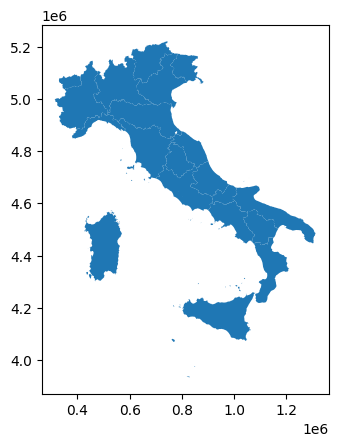

In [9]:
accoglienza_20190930_geodf.plot()

In [10]:
accoglienza_20190930_geodf.crs
accoglienza_20190930_geodf = accoglienza_20190930_geodf.to_crs(epsg=4326)


In [13]:
# Plot alla data del 2019-09-30
fig_accoglienza = px.choropleth_map(accoglienza_20190930_geodf,
                           geojson=accoglienza_20190930_geodf.geometry,
                           locations=accoglienza_20190930_geodf.index,
                           color="Migranti presenti nei centri di accoglienza",
                           center={"lat": 41.9028, "lon": 12.4964},
                           #map_style="mercator",
                           zoom=4.5)
fig_accoglienza.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})

fig_accoglienza.show()

In [16]:
accoglienza_geodf = regions.merge(accoglienza_csv, on="COD_REG").set_index("COD_REG")
accoglienza_geodf

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y
COD_REG,,,,,,,,,,
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-09-30,NaN,7198,1693.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-10-15,NaN,7134,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-10-31,NaN,7110,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-11-15,NaN,7000,1739.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((457423.465 5145719.795, 457503...",Piemonte,2019-11-30,NaN,6875,1739.0,NaN,Piemonte
...,...,...,...,...,...,...,...,...,...,...
20,5,Sardegna,"MULTIPOLYGON (((448847.899 4301757.5, 448902.8...",Sardegna,2025-07-15,NaN,2373,NaN,288.0,Sardegna
20,5,Sardegna,"MULTIPOLYGON (((448847.899 4301757.5, 448902.8...",Sardegna,2025-07-31,NaN,2446,NaN,288.0,Sardegna
20,5,Sardegna,"MULTIPOLYGON (((448847.899 4301757.5, 448902.8...",Sardegna,2025-08-15,NaN,2558,NaN,284.0,Sardegna


In [17]:
accoglienza_geodf.crs
accoglienza_geodf = accoglienza_geodf.to_crs(epsg=4326)


In [18]:
accoglienza_geodf.head()

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y
COD_REG,,,,,,,,,,
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-09-30,NaN,7198,1693.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-10-15,NaN,7134,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-10-31,NaN,7110,1748.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-11-15,NaN,7000,1739.0,NaN,Piemonte
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-11-30,NaN,6875,1739.0,NaN,Piemonte


# Mappa - Data format Wide

In [19]:
import folium
import json
import pandas as pd
import matplotlib.cm as mpl_cm
import matplotlib.colors as mpl_colors
from folium.plugins import TimeSliderChoropleth
import branca.colormap as cm


In [20]:
gdf = accoglienza_geodf.copy()

# ID regione → usa COD_REG (indice)
gdf["region_id"] = gdf.index.astype(str)

# Date
gdf["Data_Report"] = pd.to_datetime(gdf["Data_Report"], format="%Y-%m-%d")
gdf["date_str"] = gdf["Data_Report"].dt.strftime("%Y-%m-%d")

cols = [
    "Migranti presenti nei centri di accoglienza",
    "Migranti presenti nei centri SIPROIMI",
    "Migranti presenti nei centri SAI"
]

for c in cols:
    gdf[c] = pd.to_numeric(gdf[c], errors="coerce").fillna(0)

gdf = gdf.to_crs(epsg=4326)


In [21]:
gdf.head()

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y,region_id,date_str
COD_REG,,,,,,,,,,,,
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-09-30,NaN,7198,1693.0,0.0,Piemonte,1,2019-09-30
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-10-15,NaN,7134,1748.0,0.0,Piemonte,1,2019-10-15
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-10-31,NaN,7110,1748.0,0.0,Piemonte,1,2019-10-31
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-11-15,NaN,7000,1739.0,0.0,Piemonte,1,2019-11-15
1,1,Piemonte,"MULTIPOLYGON (((8.44549 46.46371, 8.44654 46.4...",Piemonte,2019-11-30,NaN,6875,1739.0,0.0,Piemonte,1,2019-11-30


In [24]:
# gdf = gdf.copy()
gdf["id"] = gdf["region_id"].astype(str) # -> devo avere un attributo 'id' all'interno del json

geojson = json.loads(
    gdf.drop_duplicates("region_id")[["id","region_id", "DEN_REG_x", "geometry"]]
    .set_index("region_id")
    .to_json()
)


In [25]:
geojson

{'type': 'FeatureCollection',
 'features': [{'id': '1',
   'type': 'Feature',
   'properties': {'id': '1', 'DEN_REG_x': 'Piemonte'},
   'geometry': {'type': 'MultiPolygon',
    'coordinates': [[[[8.445494362290935, 46.46370534857806],
       [8.446540726578757, 46.46347681338918],
       [8.447741257869769, 46.46303223988365],
       [8.448660245255386, 46.462515104385886],
       [8.449759645513712, 46.46176403000261],
       [8.452368025829527, 46.45906970589765],
       [8.462417849138731, 46.44827987286964],
       [8.465210209807053, 46.44512512158974],
       [8.46542583614727, 46.44476653834618],
       [8.46582359416236, 46.44349045303191],
       [8.465881263533923, 46.44290438084507],
       [8.465500878027433, 46.44190461839772],
       [8.464950977616528, 46.44089410075164],
       [8.464398012417915, 46.4401985380956],
       [8.464105587396856, 46.43992695951671],
       [8.46359880577136, 46.43945754325461],
       [8.463244230745003, 46.439276505483996],
       [8.46236

In [26]:
def value_to_color(val, vmin, vmax, cmap_name):
    norm = mpl_colors.Normalize(vmin=vmin, vmax=vmax)
    cmap = mpl_cm.get_cmap(cmap_name)
    return mpl_colors.to_hex(cmap(norm(val)))


In [27]:
def create_styledict_wide(gdf, value_column, cmap_name):
    styledict = {}

    # Impostare range dei valori per colore
    vmin = gdf[value_column].min()
    vmax = gdf[value_column].max()

    for region_id, grp in gdf.groupby("region_id"):
        rid = str(region_id)
        styledict[rid] = {}

        for _, row in grp.iterrows():
            val = row[value_column]
            if pd.isna(val):
                continue

            # Forzatura timestamp in millisecondi per visualizzazione corretta nel TimeSliderChoropleth
            ts = str(int(row["Data_Report"].value // 10**6))[:10]

            color = value_to_color(
                val,
                vmin,
                vmax,
                cmap_name
            )

            styledict[rid][ts] = {
                # "color": "black",
                # "weight": 0.5,
                "color": color,
                "opacity": 0.8
            }

    return styledict


In [28]:
m = folium.Map(
    location=[41.9, 12.5],
    zoom_start=5,
    tiles="CartoDB positron"
)


In [29]:
print(gdf["date_str"].unique()[:10])
print(type(gdf["date_str"].iloc[0]))


['2019-09-30' '2019-10-15' '2019-10-31' '2019-11-15' '2019-11-30'
 '2019-12-15' '2019-12-31' '2020-01-15' '2020-01-31' '2020-02-15']
<class 'str'>


In [30]:
layers = [
    ("Migranti presenti negli hot spot", "Hot Spot", "YlOrRd"),
    ("Migranti presenti nei centri di accoglienza", "Accoglienza", "RdPu"),
    ("Migranti presenti nei centri SIPROIMI", "SIPROIMI", "PuBuGn"),
    ("Migranti presenti nei centri SAI", "SAI", "YlGn"),
]
with open("debug_geojson.json", "w", encoding="utf-8") as f:
    json.dump(geojson, f, indent=2, ensure_ascii=False)

for col, name, cmap in layers:
    styledict = create_styledict_wide(gdf, col, cmap)
    print(styledict)
    fg = folium.FeatureGroup(name=name)
    with open(f"debug_styledict_{name}.json", "w", encoding="utf-8") as f:
        json.dump(styledict, f, indent=2)

    TimeSliderChoropleth(
        data=geojson,
        styledict=styledict,
        init_timestamp=0
    ).add_to(fg)
    # tsc.add_child()
    # Tooltip come child del GeoJson
    # folium.GeoJsonTooltip(
    #     fields=["DEN_REG_x", col],
    #     aliases=["Regione:", name],
    #     sticky=True
    # ).add_to(fg)
    print(fg.to_json())
    
    #gj.add_to(fg)
    

    fg.add_to(m)

# Colormaps
colormap = cm.linear.YlOrRd_09.scale(
    gdf["Migranti presenti negli hot spot"].min(),
    gdf["Migranti presenti negli hot spot"].max()
)
colormap.caption = "Migranti presenti negli hot spot"
colormap.add_to(m)

colormap = cm.linear.RdPu_09.scale(
    gdf["Migranti presenti nei centri di accoglienza"].min(),
    gdf["Migranti presenti nei centri di accoglienza"].max()
)
colormap.caption = "Migranti presenti nei centri di accoglienza"
colormap.add_to(m)

colormap = cm.linear.PuBuGn_09.scale(
    gdf["Migranti presenti nei centri SIPROIMI"].min(),
    gdf["Migranti presenti nei centri SIPROIMI"].max()
)
colormap.caption = "Migranti presenti nei centri SIPROIMI"
colormap.add_to(m)

colormap = cm.linear.YlGn_09.scale(
    gdf["Migranti presenti nei centri SAI"].min(),
    gdf["Migranti presenti nei centri SAI"].max()
)
colormap.caption = "Migranti presenti nei centri SAI"
colormap.add_to(m)

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap

{'1': {}, '10': {}, '11': {}, '12': {}, '13': {}, '14': {}, '15': {}, '16': {'1569801600': {'color': '#ffffcc', 'opacity': 0.8}, '1571097600': {'color': '#ffffcc', 'opacity': 0.8}, '1572480000': {'color': '#ffffcc', 'opacity': 0.8}, '1573776000': {'color': '#ffffcc', 'opacity': 0.8}, '1575072000': {'color': '#fffecb', 'opacity': 0.8}, '1576368000': {'color': '#ffffcc', 'opacity': 0.8}, '1577750400': {'color': '#ffffcc', 'opacity': 0.8}, '1579046400': {'color': '#ffffcc', 'opacity': 0.8}, '1580428800': {'color': '#fffcc4', 'opacity': 0.8}, '1581724800': {'color': '#ffffcc', 'opacity': 0.8}, '1582934400': {'color': '#ffffcc', 'opacity': 0.8}, '1584230400': {'color': '#ffffcc', 'opacity': 0.8}, '1585612800': {'color': '#ffffcc', 'opacity': 0.8}, '1586908800': {'color': '#ffffcc', 'opacity': 0.8}, '1588204800': {'color': '#ffffcc', 'opacity': 0.8}, '1589500800': {'color': '#ffffcc', 'opacity': 0.8}, '1590883200': {'color': '#fffcc5', 'opacity': 0.8}, '1592179200': {'color': '#fffdc8', 'opa

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap

{'1': {'1569801600': {'color': '#f873a5', 'opacity': 0.8}, '1571097600': {'color': '#f875a6', 'opacity': 0.8}, '1572480000': {'color': '#f875a6', 'opacity': 0.8}, '1573776000': {'color': '#f878a7', 'opacity': 0.8}, '1575072000': {'color': '#f87ca8', 'opacity': 0.8}, '1576368000': {'color': '#f87fa9', 'opacity': 0.8}, '1577750400': {'color': '#f881aa', 'opacity': 0.8}, '1579046400': {'color': '#f883ab', 'opacity': 0.8}, '1580428800': {'color': '#f984ab', 'opacity': 0.8}, '1581724800': {'color': '#f984ab', 'opacity': 0.8}, '1582934400': {'color': '#f988ad', 'opacity': 0.8}, '1584230400': {'color': '#f98bae', 'opacity': 0.8}, '1585612800': {'color': '#f98bae', 'opacity': 0.8}, '1586908800': {'color': '#f98dae', 'opacity': 0.8}, '1588204800': {'color': '#f98dae', 'opacity': 0.8}, '1589500800': {'color': '#f98dae', 'opacity': 0.8}, '1590883200': {'color': '#f98faf', 'opacity': 0.8}, '1592179200': {'color': '#f991b0', 'opacity': 0.8}, '1593475200': {'color': '#f992b0', 'opacity': 0.8}, '1594

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap

{'1': {'1569801600': {'color': '#86b3d5', 'opacity': 0.8}, '1571097600': {'color': '#7eb0d3', 'opacity': 0.8}, '1572480000': {'color': '#7eb0d3', 'opacity': 0.8}, '1573776000': {'color': '#80b1d4', 'opacity': 0.8}, '1575072000': {'color': '#80b1d4', 'opacity': 0.8}, '1576368000': {'color': '#86b3d5', 'opacity': 0.8}, '1577750400': {'color': '#86b3d5', 'opacity': 0.8}, '1579046400': {'color': '#82b1d4', 'opacity': 0.8}, '1580428800': {'color': '#82b1d4', 'opacity': 0.8}, '1581724800': {'color': '#82b1d4', 'opacity': 0.8}, '1582934400': {'color': '#82b1d4', 'opacity': 0.8}, '1584230400': {'color': '#86b3d5', 'opacity': 0.8}, '1585612800': {'color': '#86b3d5', 'opacity': 0.8}, '1586908800': {'color': '#82b1d4', 'opacity': 0.8}, '1588204800': {'color': '#82b1d4', 'opacity': 0.8}, '1589500800': {'color': '#90b6d7', 'opacity': 0.8}, '1590883200': {'color': '#90b6d7', 'opacity': 0.8}, '1592179200': {'color': '#8eb5d6', 'opacity': 0.8}, '1593475200': {'color': '#8eb5d6', 'opacity': 0.8}, '1594

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap

{'1': {'1569801600': {'color': '#ffffe5', 'opacity': 0.8}, '1571097600': {'color': '#ffffe5', 'opacity': 0.8}, '1572480000': {'color': '#ffffe5', 'opacity': 0.8}, '1573776000': {'color': '#ffffe5', 'opacity': 0.8}, '1575072000': {'color': '#ffffe5', 'opacity': 0.8}, '1576368000': {'color': '#ffffe5', 'opacity': 0.8}, '1577750400': {'color': '#ffffe5', 'opacity': 0.8}, '1579046400': {'color': '#ffffe5', 'opacity': 0.8}, '1580428800': {'color': '#ffffe5', 'opacity': 0.8}, '1581724800': {'color': '#ffffe5', 'opacity': 0.8}, '1582934400': {'color': '#ffffe5', 'opacity': 0.8}, '1584230400': {'color': '#ffffe5', 'opacity': 0.8}, '1585612800': {'color': '#ffffe5', 'opacity': 0.8}, '1586908800': {'color': '#ffffe5', 'opacity': 0.8}, '1588204800': {'color': '#ffffe5', 'opacity': 0.8}, '1589500800': {'color': '#ffffe5', 'opacity': 0.8}, '1590883200': {'color': '#ffffe5', 'opacity': 0.8}, '1592179200': {'color': '#ffffe5', 'opacity': 0.8}, '1593475200': {'color': '#ffffe5', 'opacity': 0.8}, '1594

/tmp/ipykernel_455/2286996698.py:3: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



In [ ]:
folium.LayerControl(collapsed=False).add_to(m) # Da impostare per la gestione dei vari layer


In [ ]:
m.save('map_liberiamoli_tutti_accoglienza.html')

### FINE - TEST WIDE

In [33]:
import numpy as np
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import seaborn as sns
import matplotlib.pyplot as plt


In [37]:
# Converto nuovamente per sicurezza la colonna Data_Report come datetime
accoglienza_geodf['Data_Report'] = pd.to_datetime(accoglienza_geodf['Data_Report'])


In [ ]:
# Lista governi (inizio, fine)
governi = {
    "Meloni": (pd.Timestamp("2022-10-22"), pd.Timestamp("2100-01-01")),
    "Draghi": (pd.Timestamp("2021-02-13"), pd.Timestamp("2022-10-22")),
    "Conte 2": (pd.Timestamp("2019-09-05"), pd.Timestamp("2021-02-13")),
    "Conte 1": (pd.Timestamp("2018-06-01"), pd.Timestamp("2019-09-05"))
}


In [39]:
def assegna_governo(data):
    for governo, (start, end) in governi.items():
        if start <= data < end:
            return governo
    return "Other"


In [40]:
accoglienza_geodf['Government'] = accoglienza_geodf['Data_Report'].apply(assegna_governo)


In [41]:
accoglienza_geodf['Government'].unique()

array(['Conte 2', 'Draghi', 'Meloni'], dtype=object)

In [42]:
accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia']

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y,Government
COD_REG,,,,,,,,,,,
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-09-30,NaN,11701,2105.0,NaN,Lombardia,Conte 2
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-10-15,NaN,11556,2108.0,NaN,Lombardia,Conte 2
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-10-31,NaN,11404,2108.0,NaN,Lombardia,Conte 2
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-11-15,NaN,11280,2081.0,NaN,Lombardia,Conte 2
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2019-11-30,NaN,11178,2081.0,NaN,Lombardia,Conte 2
...,...,...,...,...,...,...,...,...,...,...,...
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2025-07-15,NaN,14202,NaN,3222.0,Lombardia,Meloni
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2025-07-31,NaN,14253,NaN,3222.0,Lombardia,Meloni
3,1,Lombardia,"MULTIPOLYGON (((8.81427 45.01739, 8.81351 45.0...",Lombardia,2025-08-15,NaN,14180,NaN,3307.0,Lombardia,Meloni


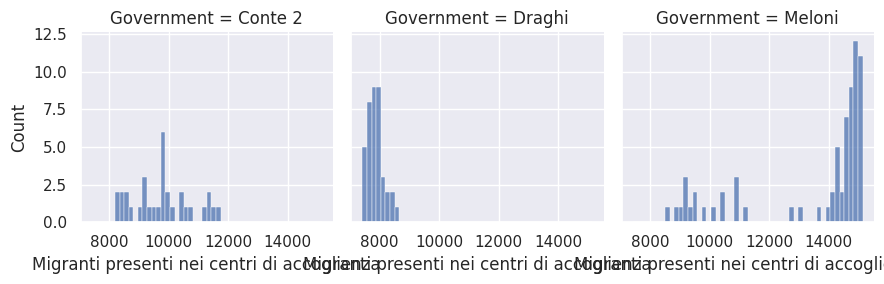

In [43]:
sns.set_theme(style="darkgrid")
sns.displot(
    accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia'], x="Migranti presenti nei centri di accoglienza", col="Government",
     height=3, bins = 50, facet_kws=dict(margin_titles=True),
)

<Axes: xlabel='Data_Report', ylabel='Migranti presenti nei centri di accoglienza'>

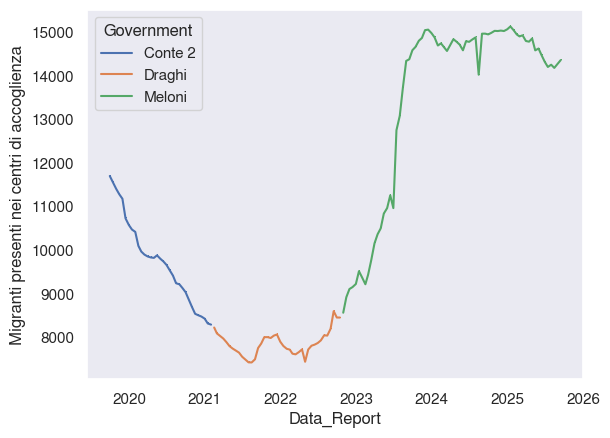

In [56]:
sns.set_theme(style="dark",
              rc={
        "font.family": "serif",
        "font.serif": ["FreeSans"],
        "font.size": 12
    })

sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia'],
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',
    marker=','
)



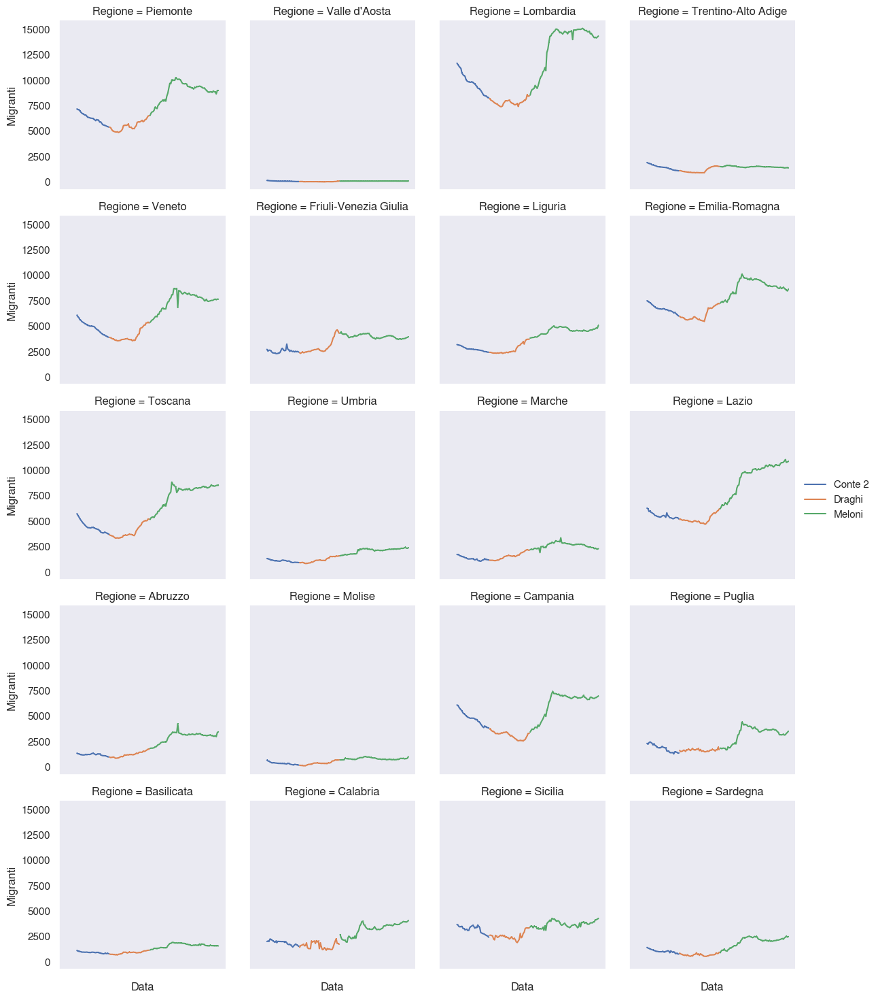

In [57]:
g = sns.FacetGrid(
    accoglienza_geodf,
    col='Regione',
    col_wrap=4,     # 4 colonne per riga
    height=3,
    sharey=True
)

g.map_dataframe(
    sns.lineplot,
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',
    marker=','
)

g.set_xticklabels(rotation=45)
g.set_axis_labels("Data", "Migranti")
g.add_legend()


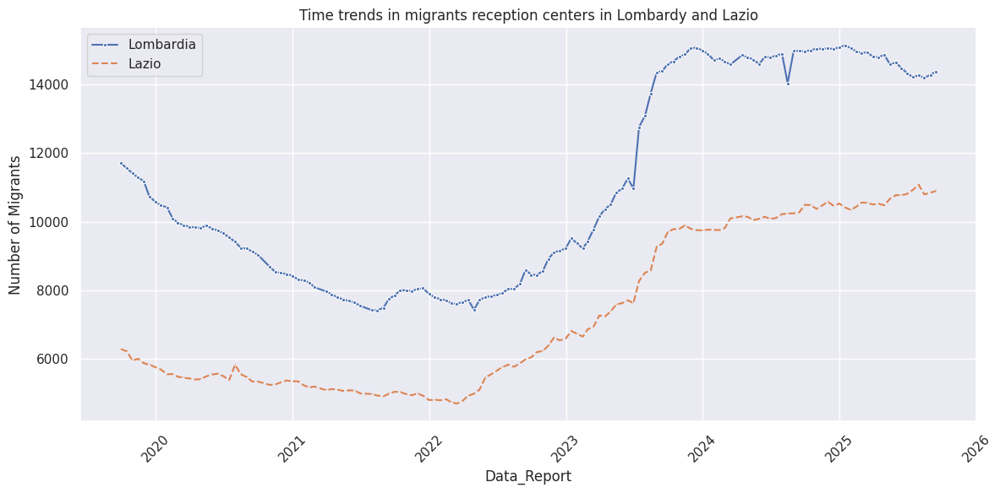

In [ ]:
plt.figure(figsize=(12, 6))

sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia'],
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    #hue='Government',
    marker='.',
    label='Lombardia'
)

sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lazio'],
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    #hue='Government',
    marker=',',
    linestyle='--',
    label='Lazio'
)
# Senza hue, problemi sulle label

plt.xticks(rotation=45)
plt.ylabel("Number of Migrants")
plt.title("Time trends in migrants reception centers in Lombardy and Lazio")
plt.legend()
plt.tight_layout()
plt.show()


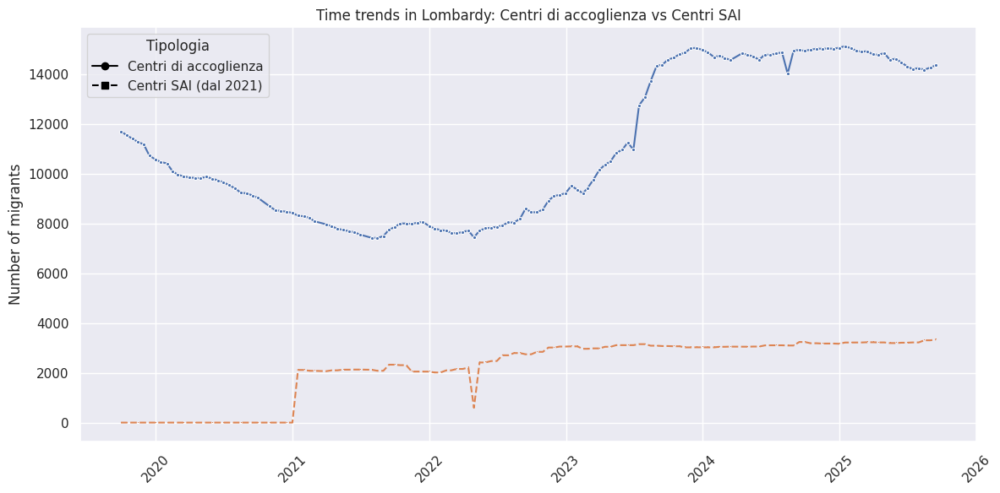

In [ ]:
df_lombardia = accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia']

# resetto l'indice per plottare
df_lombardia = (
    accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia']
    .reset_index(drop=True)
)

plt.figure(figsize=(12,6))

sns.lineplot(
    data=df_lombardia,
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    #hue='Government',
    marker='.',
    label='lombardia'
)

sns.lineplot(
    data=df_lombardia,
    x='Data_Report',
    y='Migranti presenti nei centri SAI',
    #hue='Government',
    marker=',',
    linestyle='--',
    label='lazio'
)

plt.xticks(rotation=45)
plt.ylabel("Number of migrants")
plt.xlabel("")
plt.title("Time trends in Lombardy: Centri di accoglienza vs Centri SAI")

# Creiamo la legenda manuale
import matplotlib.patches as mpatches
import matplotlib.lines as mlines

# Legenda per le tipologie (curva 1 vs curva 2)
tipo1 = mlines.Line2D([], [], color='black', marker='o', linestyle='-', label='Centri di accoglienza')
tipo2 = mlines.Line2D([], [], color='black', marker='s', linestyle='--', label='Centri SAI (dal 2021)')

plt.legend(handles=[tipo1, tipo2], title="Tipologia")

plt.tight_layout()
plt.show()


In [69]:
accoglienza_geodf = accoglienza_geodf.fillna(0)


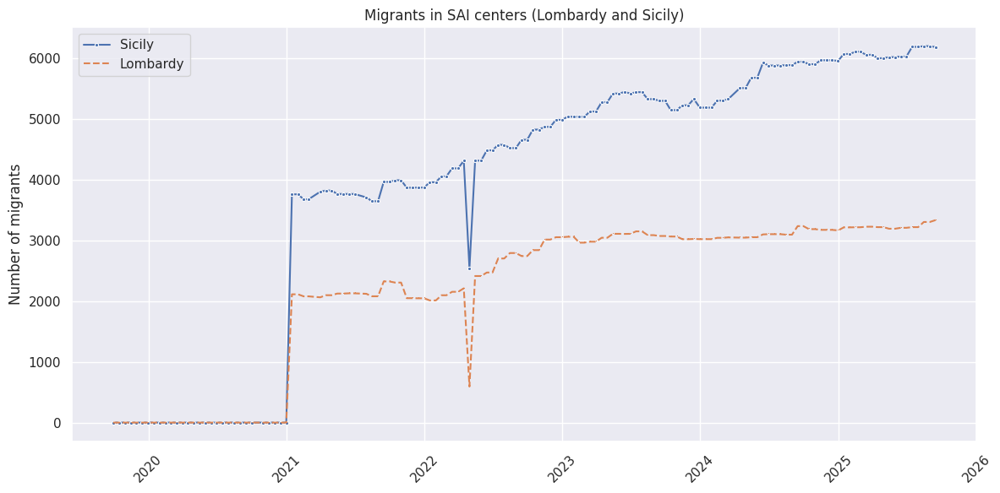

In [94]:
# Migranti presenti nei centri SAI	

plt.figure(figsize=(12, 6))

sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Sicilia'],
    x='Data_Report',
    y='Migranti presenti nei centri SAI',
    #hue='Government',
    marker='.',
    label='Sicily'
)

sns.lineplot(
    data=accoglienza_geodf[accoglienza_geodf['Regione'] == 'Lombardia'],
    x='Data_Report',
    y='Migranti presenti nei centri SAI',
    #hue='Government', 
    marker=',',
    linestyle='--',
    label='Lombardy'
)

plt.xticks(rotation=45)
plt.ylabel("Number of migrants")
plt.xlabel("")
plt.title("Migrants in SAI centers (Lombardy and Sicily)")
plt.legend()
plt.tight_layout()
plt.show()


# VERIFICA PER MACROREGIONI

In [71]:
macroregions

,COD_RIP,DEN_RIP,geometry
0,1,Nord-ovest,"MULTIPOLYGON (((568231.969 4874857.994, 568233..."
1,2,Nord-est,"MULTIPOLYGON (((618335.21 4893983.16, 618329.9..."
2,3,Centro,"MULTIPOLYGON (((876027.96 4525207.198, 876222...."
3,4,Sud,"MULTIPOLYGON (((1083304.797 4416671.21, 108333..."
4,5,Isole,"MULTIPOLYGON (((822779.053 3935557.494, 822909..."


In [100]:
pts = accoglienza_geodf.copy()
macroregions = macroregions.to_crs("4326")
print(pts.crs)
print(accoglienza_geodf.crs)
print(macroregions.crs)
pts.geometry = pts.geometry.representative_point()

joined = gpd.sjoin(
    pts,
    macroregions[['DEN_RIP', 'geometry']],
    predicate='within',
    how='left'
)

EPSG:4326
EPSG:4326
EPSG:4326


In [101]:
type(joined)
joined = joined.rename(columns={'DEN_RIP': 'macroregion'})


In [102]:
joined.head()

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y,Government,index_right,macroregion
COD_REG,,,,,,,,,,,,,
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-09-30,0.0,7198,1693.0,0.0,Piemonte,Conte 2,0,Nord-ovest
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-10-15,0.0,7134,1748.0,0.0,Piemonte,Conte 2,0,Nord-ovest
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-10-31,0.0,7110,1748.0,0.0,Piemonte,Conte 2,0,Nord-ovest
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-11-15,0.0,7000,1739.0,0.0,Piemonte,Conte 2,0,Nord-ovest
1,1,Piemonte,POINT (7.83374 45.26229),Piemonte,2019-11-30,0.0,6875,1739.0,0.0,Piemonte,Conte 2,0,Nord-ovest


In [103]:
joined[(joined['macroregion'] == 'Sud') & (joined['Data_Report'] == pd.Timestamp('2025-09-15'))]#['Migranti presenti nei centri di accoglienza'].sum()

,COD_RIP,DEN_REG_x,geometry,Regione,Data_Report,Migranti presenti negli hot spot,Migranti presenti nei centri di accoglienza,Migranti presenti nei centri SIPROIMI,Migranti presenti nei centri SAI,DEN_REG_y,Government,index_right,macroregion
COD_REG,,,,,,,,,,,,,
13,4,Abruzzo,POINT (13.85202 42.291),Abruzzo,2025-09-15,0.0,3471,0.0,935.0,Abruzzo,Meloni,3,Sud
14,4,Molise,POINT (14.62481 41.71707),Molise,2025-09-15,0.0,1012,0.0,928.0,Molise,Meloni,3,Sud
15,4,Campania,POINT (14.91696 40.7482),Campania,2025-09-15,0.0,6982,0.0,4140.0,Campania,Meloni,3,Sud
16,4,Puglia,POINT (16.82107 40.87064),Puglia,2025-09-15,0.0,3530,0.0,3702.0,Puglia,Meloni,3,Sud
17,4,Basilicata,POINT (16.12939 40.51894),Basilicata,2025-09-15,0.0,1592,0.0,850.0,Basilicata,Meloni,3,Sud
18,4,Calabria,POINT (16.64341 39.02987),Calabria,2025-09-15,251.0,4076,0.0,3449.0,Calabria,Meloni,3,Sud


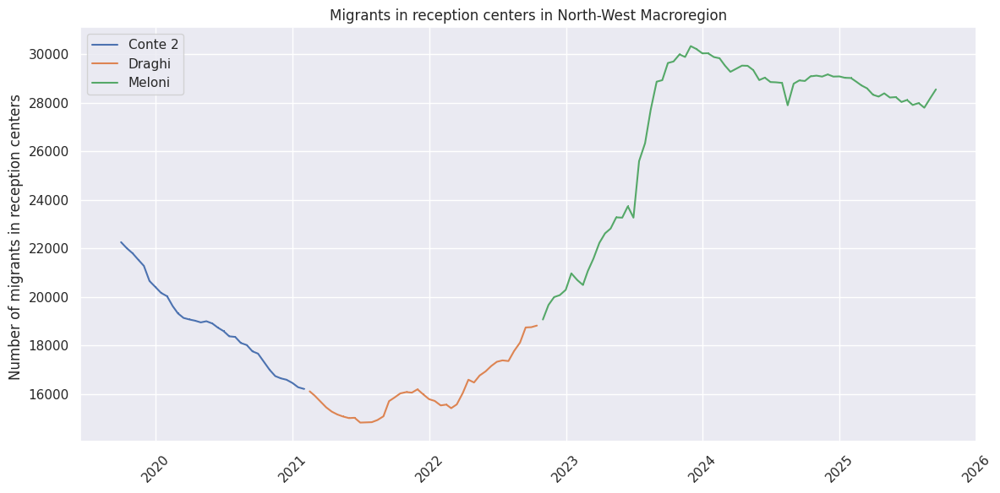

In [104]:
plt.figure(figsize=(12, 6))


sns.lineplot(
    data=joined[joined['macroregion'] == 'Nord-ovest'],
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',
    estimator='sum',
    errorbar=None,
    marker=','
)

plt.xticks(rotation=45)
plt.ylabel("Number of migrants in reception centers ")
plt.xlabel("")
plt.title("Migrants in reception centers in North-West Macroregion")
plt.legend()
plt.tight_layout()
plt.show()



<Figure size 1200x600 with 0 Axes>

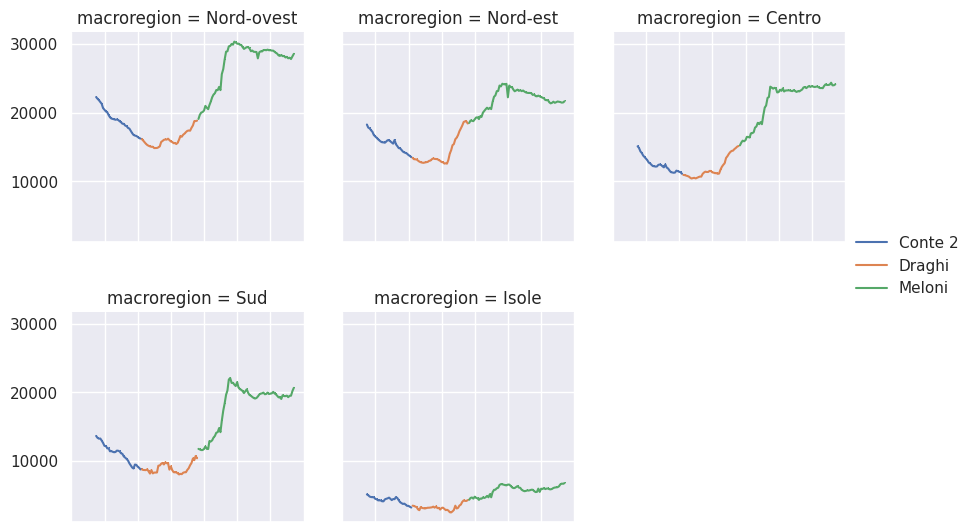

In [109]:
plt.figure(figsize=(12, 6))

g = sns.FacetGrid(
    joined,
    col='macroregion',
    col_wrap=3,     # 3 colonne per riga
    height=3,
    sharey=True
)

g.map_dataframe(
    sns.lineplot,
    x='Data_Report',
    y='Migranti presenti nei centri di accoglienza',
    hue='Government',
    marker=',',
    estimator='sum',
    errorbar=None
)


g.set_xticklabels(rotation=45)
g.set_axis_labels("", "")
g.add_legend()
plt.show()
